# Imports

In [1]:
import os
import cv2
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
import numpy as np
import tensorflow as tf
from imageio import mimsave
from keras import backend as K
import matplotlib.pyplot as plt
from IPython.display import display as display_fn
from IPython.display import Image, clear_output

In [2]:
os.makedirs("Stylised_Images")

# Data Processing

## Utilities

We've provided some utility functions below to help in loading, visualizing, and preprocessing the images.

In [3]:
def tensor_to_image(tensor):
  '''converts a tensor to an image'''
  tensor_shape = tf.shape(tensor)
  number_elem_shape = tf.shape(tensor_shape)
  if number_elem_shape > 3:
    assert tensor_shape[0] == 1
    tensor = tensor[0]
  return tf.keras.preprocessing.image.array_to_img(tensor) 


def load_img(path_to_img):
  '''loads an image as a tensor and scales it to 512 pixels'''
  max_dim = 512
  image = tf.io.read_file(path_to_img)
  image = tf.image.decode_jpeg(image)
  image = tf.image.convert_image_dtype(image, tf.float32)

  shape = tf.shape(image)[:-1]
  shape = tf.cast(tf.shape(image)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  image = tf.image.resize(image, new_shape)
  image = image[tf.newaxis, :]
  image = tf.image.convert_image_dtype(image, tf.uint8)

  return image


def load_images(content_path, style_path):
  '''loads the content and path images as tensors'''
  content_image = load_img("{}".format(content_path))
  style_image = load_img("{}".format(style_path))

  return content_image, style_image


def imshow(image, title=None):
  '''displays an image with a corresponding title'''
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)
    

  plt.imshow(image)
  plt.axis(False)
  if title:
    plt.title(title)
    
    
def show_images_with_objects(images, titles=[]):
  '''displays a row of images with corresponding titles'''
  if len(images) != len(titles):
    return

  plt.figure(figsize=(20, 12))
  for idx, (image, title) in enumerate(zip(images, titles)):
    plt.subplot(1, len(images), idx + 1)
    plt.xticks([])
    plt.yticks([])
    imshow(image, title)


def clip_image_values(image, min_value=0.0, max_value=255.0):
  '''clips the image pixel values by the given min and max'''
  return tf.clip_by_value(image, clip_value_min=min_value, clip_value_max=max_value)


def preprocess_image(image):
  '''preprocesses a given image to use with Inception model'''
  image = tf.cast(image, dtype=tf.float32)
  image = (image / 127.5) - 1.0

  return image

## Image Paths

In [4]:
path = "../input/neural-style-transfer/"
# set default images
content_path_1 = f'{path}/content1.jpg'
style_path_1 = f'{path}/style1.jpg'
content_path_2 = f'{path}/content2.jpg'
style_path_2 = f'{path}/style2.jpg'
content_path_3 = f'{path}/content3.jpeg'
style_path_3 = f'{path}/style3.jpg'
content_path_4 = f'{path}/content4.jpg'
style_path_4 = f'{path}/style4.jpeg'
content_path_5 = f'{path}/content5.jpg'
style_path_5 = f'{path}/style5.jpg'
content_path_6 = f'{path}/content6.jpg'
style_path_6 = f'{path}/style6.jpg'
content_path_7 = f'{path}/content7.jpg'
style_path_7 = f'{path}/style7.jpg'


## HYPERPARAMETERS 

In [5]:
EPOCHS = 10
STEPS_PER_EPOCH =100
STYLE_WEIGHT = 1e-1
CONTENT_WEIGHT = 1e-32
INITIAL_LEARNING_RATE = 80.0
DECAY_STEPS = 100
DECAY_RATE = 0.80


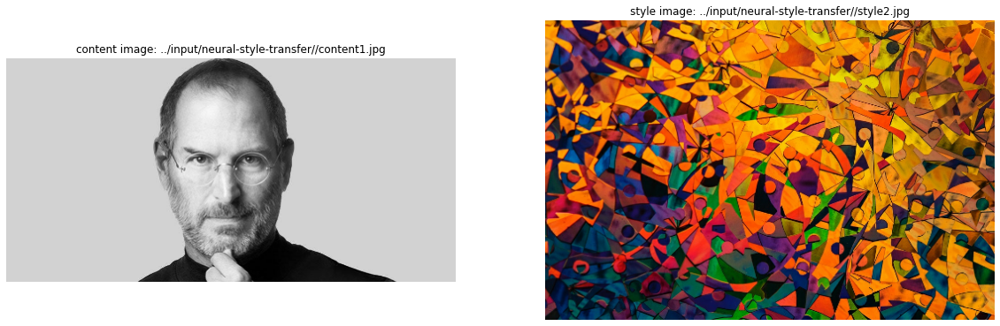

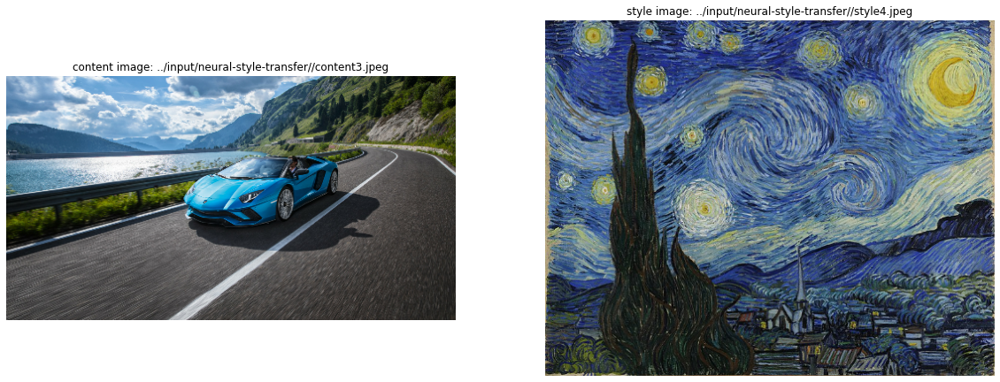

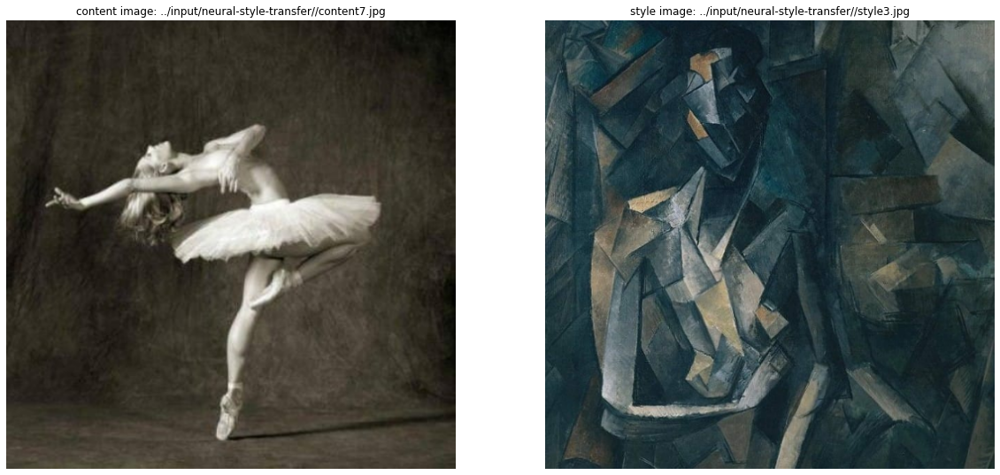

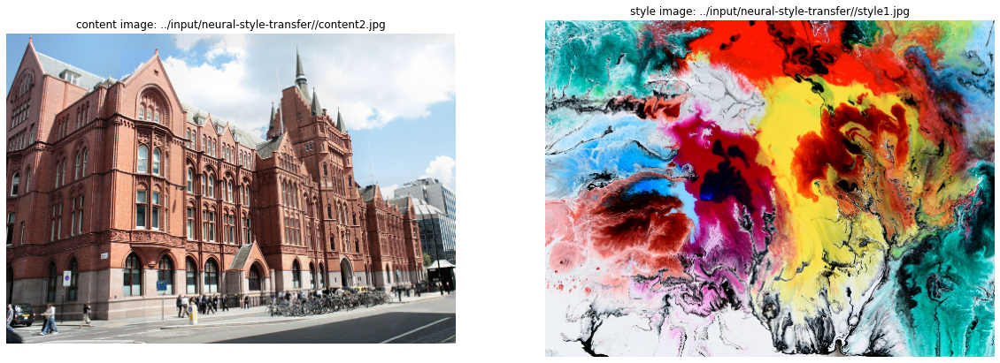

In [6]:
content_image_1, style_image_1 = load_images(content_path_7, style_path_3)
content_image_2 , style_image_2 = load_images(content_path_1 , style_path_2)
content_image_3 , style_image_3 = load_images(content_path_3,style_path_4)
content_image_4 , style_image_4 = load_images(content_path_2 , style_path_1)
show_images_with_objects([content_image_1, style_image_1], 
                         titles=[f'content image: {content_path_1}',
                                 f'style image: {style_path_2}'])

show_images_with_objects([content_image_2, style_image_2], 
                         titles=[f'content image: {content_path_3}',
                                 f'style image: {style_path_4}'])

show_images_with_objects([content_image_3, style_image_3], 
                         titles=[f'content image: {content_path_7}',
                                 f'style image: {style_path_3}'])

show_images_with_objects([content_image_4, style_image_4], 
                         titles=[f'content image: {content_path_2}',
                                 f'style image: {style_path_1}'])



# MODEL

## Build the model 

InceptioNetV3----->feature extractor

Choose intermediate layers from the network to extract the style and content of the image:

- For the style layers, I am using first layer of each convolutional block.

- For the content layer, I am using he second convolutional layer of the last convolutional block.

In [34]:
# style layers of interest
style_layers = ['conv2d', 
                'conv2d_1', 
                'conv2d_2', 
                'conv2d_3', 
                'conv2d_4'] 

# choose the content layer and put in a list
content_layers = ['conv2d_88'] 

# combine the two lists (put the style layers before the content layers)
output_layers = style_layers + content_layers 

# declare auxiliary variables holding the number of style and content layers
NUM_CONTENT_LAYERS = len(content_layers)
NUM_STYLE_LAYERS = len(style_layers)

Define your model to take the same input as the standard InceptionNet V3 model, and output just the selected content and style layers.

In [8]:
def inception_model(layer_names):
      """ Creates a inception model that outputs the style and content layer activations.

      Args:
        layer_names: a list of strings, representing the names of the desired content and style layers

      Returns:
        A model that takes the regular inceptionnet v3 input and outputs just the content and style layers.

      """

      # load the the pretrained InceptionV3, trained on imagenet data
      inception = tf.keras.applications.inception_v3.InceptionV3(include_top=False, weights='imagenet')

      # freeze the weights of the model's layers (make them not trainable)
      inception.trainable = False

      # create a list of layer objects that are specified by layer_names
      outputs = [inception.get_layer(name).output for name in layer_names]

      # create the model that outputs content and style layers only
      model = tf.keras.Model(inputs=inception.input, outputs=outputs)

      return model

In [9]:
# clear session to make layer naming consistent if re-running the cell
K.clear_session()

# create a inception model
inception = inception_model(output_layers)


87924736/87910968 [==============================] - 4s 0us/step


# LOSS FUNCTIONS



### Style loss


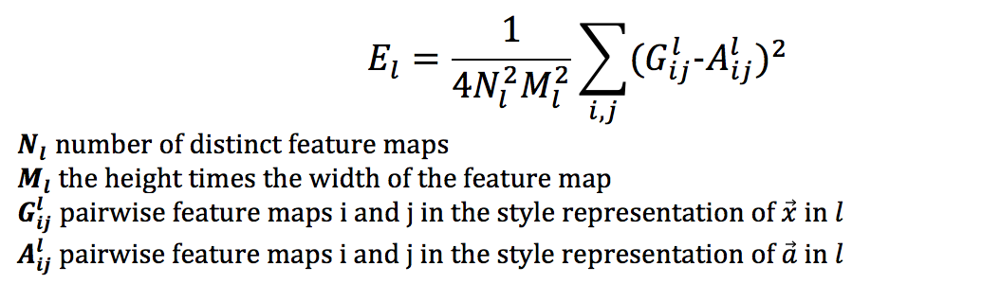

Our goal is to decrease the style loss


In [10]:
def get_style_loss(features, targets):
  """Expects two images of dimension h, w, c
  
  Args:
    features: tensor with shape: (height, width, channels)
    targets: tensor with shape: (height, width, channels)

  Returns:
    style loss (scalar)
  """
  # get the average of the squared errors
  style_loss = tf.reduce_mean(tf.square(features - targets))
    
  return style_loss

### Content loss


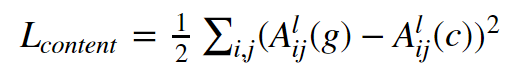


The end goal is to increase the content loss 


In [11]:
def get_content_loss(features, targets):
  """Expects two images of dimension h, w, c
  
  Args:
    features: tensor with shape: (height, width, channels)
    targets: tensor with shape: (height, width, channels)
  
  Returns:
    content loss (scalar)
  """
  # get the sum of the squared error multiplied by a scaling factor
  content_loss = 0.5 * tf.reduce_sum(tf.square(features - targets))
    
  return content_loss

### Gram matrix


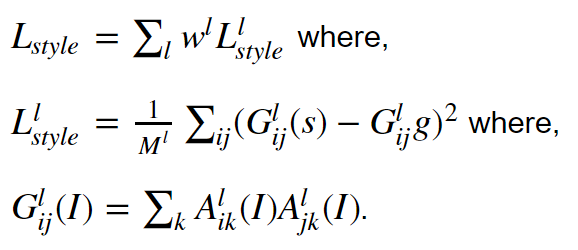




In [12]:
def gram_matrix(input_tensor):
  """ Calculates the gram matrix and divides by the number of locations
  Args:
    input_tensor: tensor of shape (batch, height, width, channels)
    
  Returns:
    scaled_gram: gram matrix divided by the number of locations
  """

  # calculate the gram matrix of the input tensor
  gram = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor) 

  # get the height and width of the input tensor
  input_shape = tf.shape(input_tensor) 
  height = input_shape[1] 
  width = input_shape[2] 

  # get the number of locations (height times width), and cast it as a tf.float32
  num_locations = tf.cast(height * width, tf.float32)

  # scale the gram matrix by dividing by the number of locations
  scaled_gram = gram / num_locations
    
  return scaled_gram

### Style image features

Given the style image as input, you'll get the style features of the custom InceptionV3 model that was created using `inception_model()`.
- We will first preprocess the image using the given `preprocess_image()` function.
- We will then get the outputs of the inception model.
- From the outputs, just get the style feature layers and not the content feature layer.
- For each style layer, calculate the gram matrix using the `gram_matrix()` function.


In [13]:
def get_style_image_features(image):  
  """ Get the style image features
  
  Args:
    image: an input image
    
  Returns:
    gram_style_features: the style features as gram matrices
  """
  # preprocess the image using the given preprocessing function
  preprocessed_style_image = preprocess_image(image) 

  # get the outputs from the custom inception model that you created using inception_model()
  outputs = inception(preprocessed_style_image) 

  # Get just the style feature layers (exclude the content layer)
  style_outputs = outputs[:NUM_STYLE_LAYERS] 

  # for each style layer, calculate the gram matrix for that layer and store these results in a list
  gram_style_features = [gram_matrix(style_layer) for style_layer in style_outputs] 

  return gram_style_features

### Content image features

Given the content image as input, you'll get the content features of the custom InceptionV3 model that was created using `inception_model()`.
- First preprocess the image using the given `preprocess_image()` function.
- Get the outputs of the inception model.
- From the outputs, just get the content feature layers and not the style feature layer.
> Gram matrix will not be calculated for content image features


In [14]:
def get_content_image_features(image):
  """ Get the content image features
  
  Args:
    image: an input image
    
  Returns:
    content_outputs: the content features of the image
  """
  # preprocess the image
  preprocessed_content_image = preprocess_image(image)
    
  # get the outputs from the inception model
  outputs = inception(preprocessed_content_image) 

  # get the content layers of the outputs
  content_outputs = outputs[NUM_STYLE_LAYERS:]

  # return the content layer outputs of the content image
  return content_outputs

### Total Loss

The total loss is given by $L_{total} = \alpha L_{content} + \beta L_{style}$, where $\alpha$ and $\beta$ are weights we will give to the content and style features to generate the new image. 


In [15]:
def get_style_content_loss(style_targets, style_outputs, content_targets, 
                           content_outputs, style_weight, content_weight):
  """ Combine the style and content loss
  
  Args:
    style_targets: style features of the style image
    style_outputs: style features of the generated image
    content_targets: content features of the content image
    content_outputs: content features of the generated image
    style_weight: weight given to the style loss
    content_weight: weight given to the content loss

  Returns:
    total_loss: the combined style and content loss

  """
    
  # sum of the style losses
  style_loss = tf.add_n([ get_style_loss(style_output, style_target)
                           for style_output, style_target in zip(style_outputs, style_targets)])
  
  # Sum up the content losses
  content_loss = tf.add_n([get_content_loss(content_output, content_target)
                           for content_output, content_target in zip(content_outputs, content_targets)])

  # scale the style loss by multiplying by the style weight and dividing by the number of style layers
  style_loss = style_loss * style_weight / NUM_STYLE_LAYERS 

  # scale the content loss by multiplying by the content weight and dividing by the number of content layers
  content_loss = content_loss * content_weight / NUM_CONTENT_LAYERS 
    
  # sum up the style and content losses
  total_loss = style_loss + content_loss 

  return total_loss

## Generate the Stylized Image


### Calculate gradients

The function is used to calculate gradients. The values here will be used to update the generated image to have more of the style and content features. 


In [16]:
def calculate_gradients(image, style_targets, content_targets, 
                        style_weight, content_weight, var_weight):
  """ Calculate the gradients of the loss with respect to the generated image
  Args:
    image: generated image
    style_targets: style features of the style image
    content_targets: content features of the content image
    style_weight: weight given to the style loss
    content_weight: weight given to the content loss
    var_weight: weight given to the total variation loss
  
  Returns:
    gradients: gradients of the loss with respect to the input image
  """
  with tf.GradientTape() as tape:
      
    # get the style image features
    style_features = get_style_image_features(image) 
      
    # get the content image features
    content_features = get_content_image_features(image) 
      
    # get the style and content loss
    loss = get_style_content_loss(style_targets, style_features, content_targets, 
                                  content_features, style_weight, content_weight) 

  # calculate gradients of loss with respect to the image
  gradients = tape.gradient(loss, image) 

  return gradients

### Update the image with the style

- Calculate Gradients
- Apply optimizers
- Clip the image values b/w `[0,255]` using the function clip_image_values

In [17]:
def update_image_with_style(image, style_targets, content_targets, style_weight, 
                            var_weight, content_weight, optimizer):
  """
  Args:
    image: generated image
    style_targets: style features of the style image
    content_targets: content features of the content image
    style_weight: weight given to the style loss
    content_weight: weight given to the content loss
    var_weight: weight given to the total variation loss
    optimizer: optimizer for updating the input image
  """

  # calculate gradients using the function that you just defined.
  gradients = calculate_gradients(image, style_targets, content_targets, 
                                  style_weight, content_weight, var_weight) 

  # apply the gradients to the given image
  optimizer.apply_gradients([(gradients, image)]) 

  # clip the image using the utility clip_image_values() function
  image.assign(clip_image_values(image, min_value=0.0, max_value=255.0))

## Style Transfer

- Calculate style_targets and content_targets using the `get_style_image_features()` and `get_content_image_features()` functions
- Update the generated image with style using the `update_image_with_style()` function
- Finally Display the generated image

In [18]:
def fit_style_transfer(style_image, content_image, style_weight=1e-2, content_weight=1e-4, 
                       var_weight=0, optimizer='adam', epochs=1, steps_per_epoch=1):
  """ Performs neural style transfer.
  Args:
    style_image: image to get style features from
    content_image: image to stylize 
    style_targets: style features of the style image
    content_targets: content features of the content image
    style_weight: weight given to the style loss
    content_weight: weight given to the content loss
    var_weight: weight given to the total variation loss
    optimizer: optimizer for updating the input image
    epochs: number of epochs
    steps_per_epoch = steps per epoch
  
  Returns:
    generated_image: generated image at final epoch
    images: collection of generated images per epoch  
  """

  images = []
  step = 0

  # get the style image features 
  style_targets = get_style_image_features(style_image)
    
  # get the content image features
  content_targets = get_content_image_features(content_image)

  # initialize the generated image for updates
  generated_image = tf.cast(content_image, dtype=tf.float32)
  generated_image = tf.Variable(generated_image) 
  
  # collect the image updates starting from the content image
  images.append(content_image)
  image = tensor_to_image(content_image)
  display_fn(image)
  # incrementally update the content image with the style features
  for n in range(epochs):
    for m in range(steps_per_epoch):
      step += 1
    
      # Update the image with the style using the function that you defined
      update_image_with_style(generated_image, style_targets, content_targets, 
                              style_weight, var_weight, content_weight, optimizer) 
    
      print(".", end='')

      if (m + 1) % 10 == 0:
        images.append(generated_image)
    
    # display the current stylized image
    clear_output(wait=True)
    display_image = tensor_to_image(generated_image)
    display_fn(display_image)

    # append to the image collection for visualization later
    images.append(generated_image)
#     if step ==500:
#         display_fn(images[4])
        
    print("Train step: {}".format(step))
  
  # convert to uint8 (expected dtype for images with pixels in the range [0,255])
  generated_image = tf.cast(generated_image, dtype=tf.uint8)

  return generated_image, images

# Training

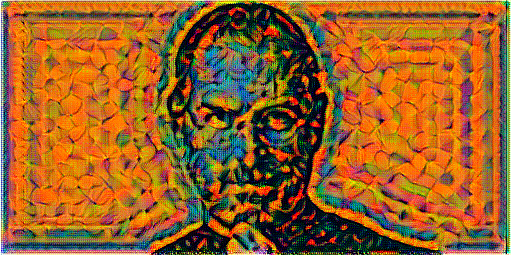

Train step: 1000


In [19]:
# define style and content weight
style_weight =  STYLE_WEIGHT
content_weight = CONTENT_WEIGHT

# define optimizer. learning rate decreases per epoch.
adam = tf.optimizers.Adam(
    tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=INITIAL_LEARNING_RATE, decay_steps=DECAY_STEPS, decay_rate=DECAY_RATE
    )
)
# start the neural style transfer
stylized_image, display_images = fit_style_transfer(style_image=style_image_1, content_image=content_image_1, 
                                                    style_weight=style_weight, content_weight=content_weight,
                                                    var_weight=0, optimizer=adam, epochs = EPOCHS, steps_per_epoch=STEPS_PER_EPOCH)



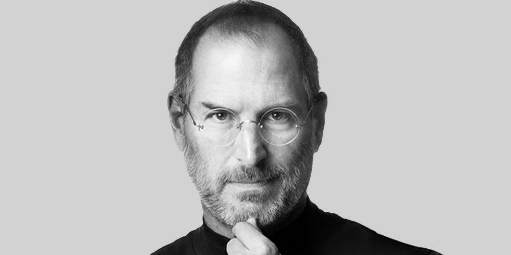

Epoch 0


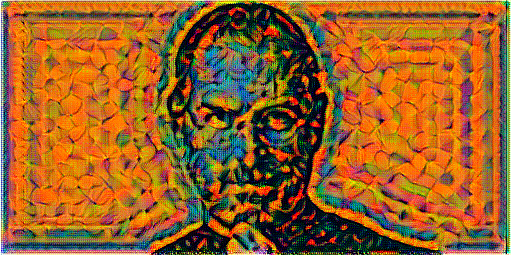

Epoch 5


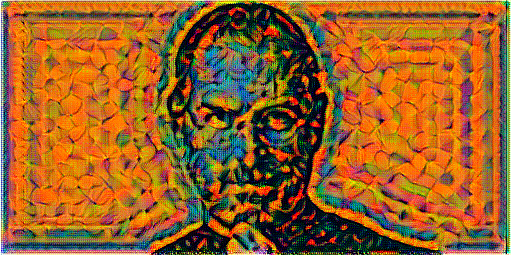

Epoch 10


In [20]:
display_image = tensor_to_image(display_images[0])
display_fn(display_image)
print("Epoch 0")

display_image = tensor_to_image(display_images[4])
display_fn(display_image)
print("Epoch 5")

display_image = tensor_to_image(display_images[9])
display_fn(display_image)
print("Epoch 10")
    

    
    

In [21]:
name = "content_1_style_2.jpg"
path = os.path.join("./Stylised_Images",name)
tf.keras.utils.save_img(path ,tf.squeeze(stylized_image,axis =0))

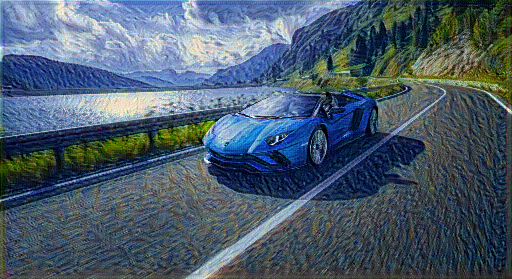

Train step: 1000


In [22]:
# define style and content weight
style_weight =  STYLE_WEIGHT
content_weight = CONTENT_WEIGHT

# define optimizer. learning rate decreases per epoch.
adam = tf.optimizers.Adam(
    tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=INITIAL_LEARNING_RATE, decay_steps = DECAY_STEPS, decay_rate=DECAY_RATE
    )
)
# start the neural style transfer
stylized_image, display_images = fit_style_transfer(style_image=style_image_2, content_image=content_image_2, 
                                                    style_weight=style_weight, content_weight=content_weight,
                                                    var_weight=0, optimizer=adam, epochs=EPOCHS, steps_per_epoch=STEPS_PER_EPOCH)



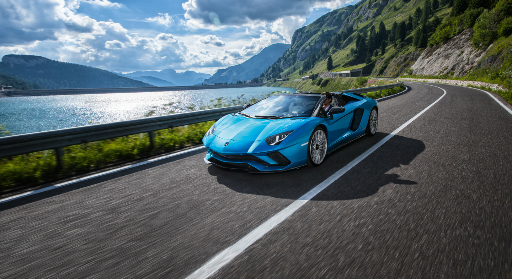

Epoch 0


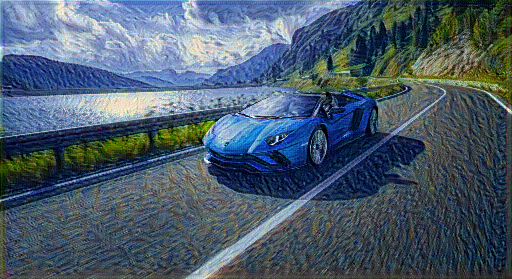

Epoch 5


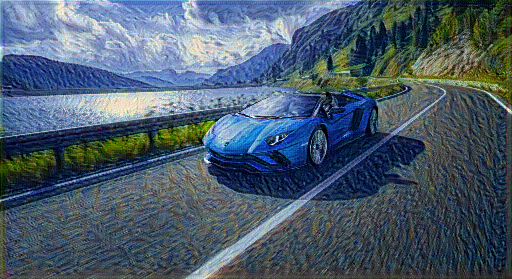

Epoch 10


In [23]:
display_image = tensor_to_image(display_images[0])
display_fn(display_image)
print("Epoch 0")

display_image = tensor_to_image(display_images[4])
display_fn(display_image)
print("Epoch 5")

display_image = tensor_to_image(display_images[9])
display_fn(display_image)
print("Epoch 10")
    

In [24]:
name = "content_3_style_4.jpg"
path = os.path.join("./Stylised_Images",name)
tf.keras.utils.save_img(path ,tf.squeeze(stylized_image,axis =0))

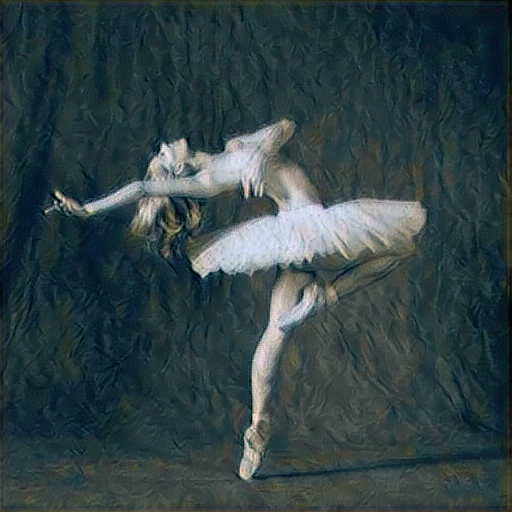

Train step: 1000


In [25]:
# define style and content weight
style_weight =  STYLE_WEIGHT
content_weight = CONTENT_WEIGHT

# define optimizer. learning rate decreases per epoch.
adam = tf.optimizers.Adam(
    tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=INITIAL_LEARNING_RATE, decay_steps=DECAY_STEPS, decay_rate=DECAY_RATE
    )
)
# start the neural style transfer
stylized_image, display_images = fit_style_transfer(style_image=style_image_3, content_image=content_image_3, 
                                                    style_weight=style_weight, content_weight=content_weight,
                                                    var_weight=0, optimizer=adam, epochs=EPOCHS, steps_per_epoch=STEPS_PER_EPOCH)



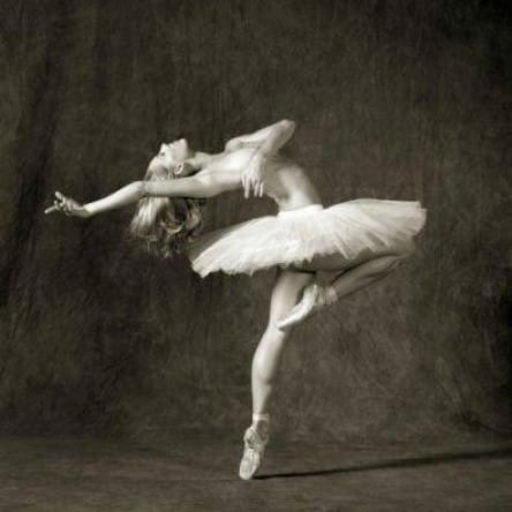

Epoch 0


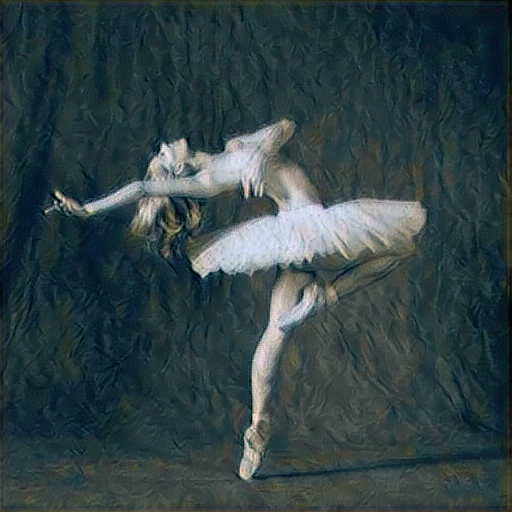

Epoch 5


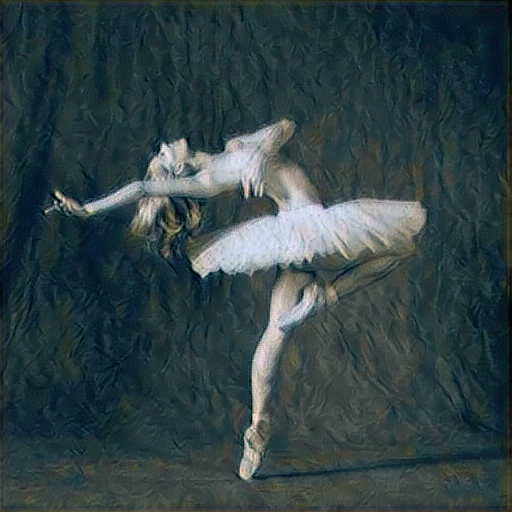

Epoch 10


In [26]:
display_image = tensor_to_image(display_images[0])
display_fn(display_image)
print("Epoch 0")

display_image = tensor_to_image(display_images[4])
display_fn(display_image)
print("Epoch 5")

display_image = tensor_to_image(display_images[9])
display_fn(display_image)
print("Epoch 10")
    

In [27]:
name = "content_7_style_3.jpg"
path = os.path.join("./Stylised_Images",name)
tf.keras.utils.save_img(path ,tf.squeeze(stylized_image,axis =0))

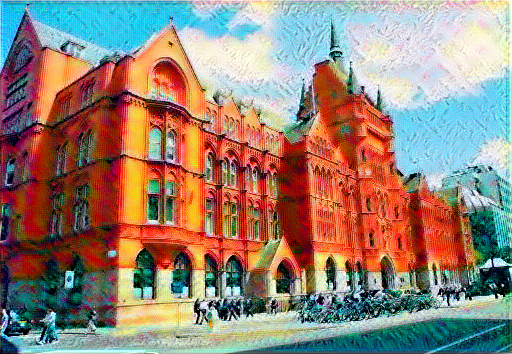

Train step: 1000


In [28]:
# define style and content weight
style_weight =  STYLE_WEIGHT
content_weight = CONTENT_WEIGHT

# define optimizer. learning rate decreases per epoch.
adam = tf.optimizers.Adam(
    tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=INITIAL_LEARNING_RATE, decay_steps=DECAY_STEPS, decay_rate=DECAY_RATE
    )
)
# start the neural style transfer
stylized_image, display_images = fit_style_transfer(style_image=style_image_4, content_image=content_image_4, 
                                                    style_weight=style_weight, content_weight=content_weight,
                                                    var_weight=0, optimizer=adam, epochs=EPOCHS, steps_per_epoch=STEPS_PER_EPOCH)



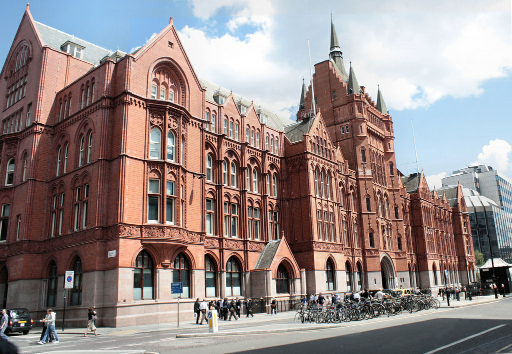

Epoch 0


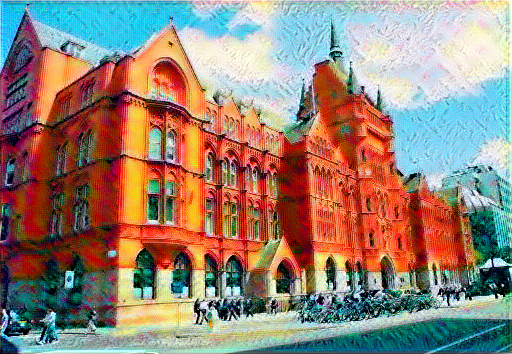

Epoch 5


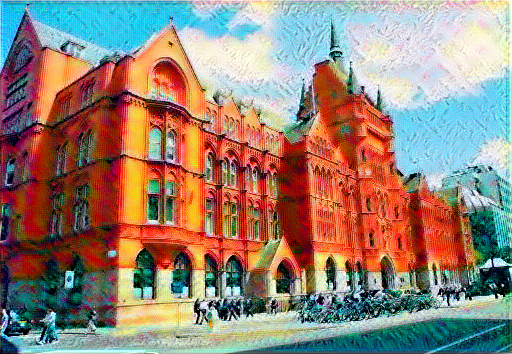

Epoch 10


In [29]:
display_image = tensor_to_image(display_images[0])
display_fn(display_image)
print("Epoch 0")

display_image = tensor_to_image(display_images[4])
display_fn(display_image)
print("Epoch 5")

display_image = tensor_to_image(display_images[9])
display_fn(display_image)
print("Epoch 10")
    

In [30]:
name = "content_2_style_1.jpg"
path = os.path.join("./Stylised_Images",name)
tf.keras.utils.save_img(path ,tf.squeeze(stylized_image,axis =0))

In [31]:
def load_image(content_path, style_path,combined_path):
  '''loads the content and path images as tensors'''
  content_image = load_img("{}".format(content_path))
  style_image = load_img("{}".format(style_path))
  combined_image = load_img("{}".format(combined_path))

  return content_image, style_image , combined_image


In [32]:
content_1_style_2_path = "./Stylised_Images/content_1_style_2.jpg"
content_2_style_1_path = "./Stylised_Images/content_2_style_1.jpg"
content_3_style_4_path = "./Stylised_Images/content_3_style_4.jpg"
content_7_style_3_path = "./Stylised_Images/content_7_style_3.jpg"

# Visualization

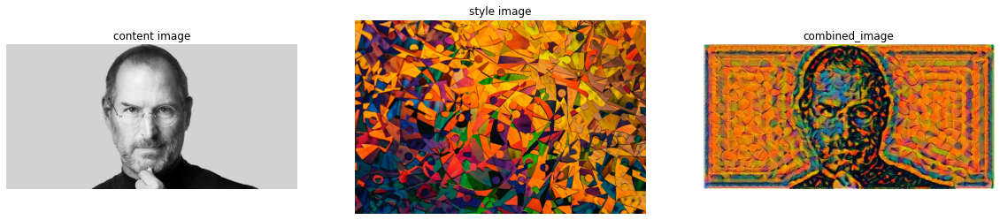

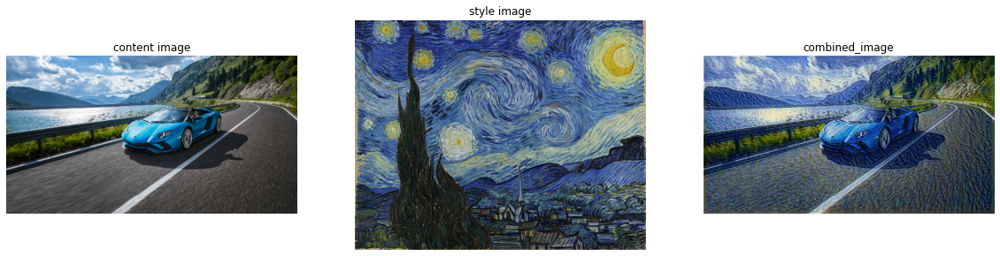

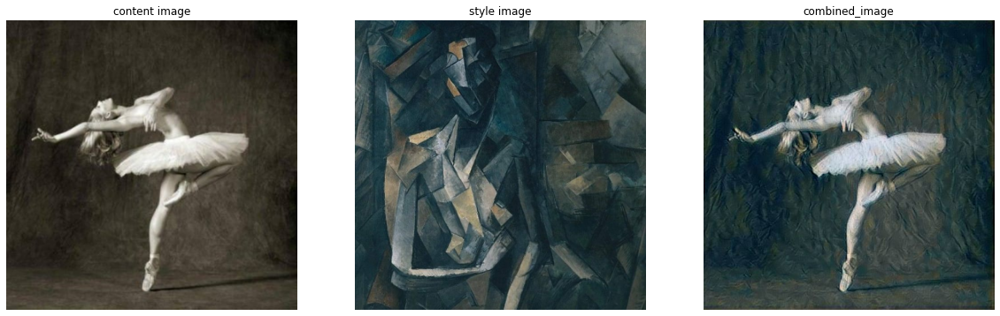

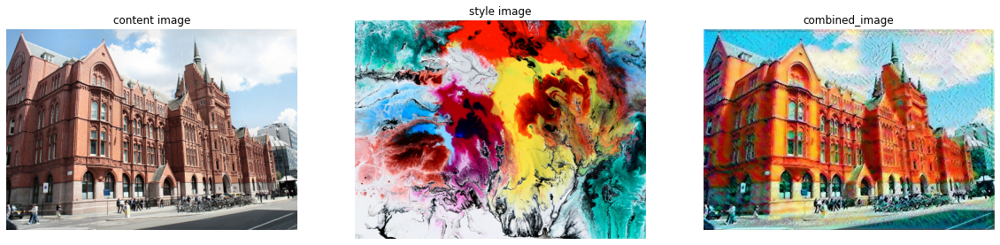

In [33]:
content_1 , style_1 , combined_1 = load_image(content_path_7 , style_path_3 , content_1_style_2_path)
content_2 , style_2 , combined_2 = load_image(content_path_1 , style_path_2 , content_3_style_4_path)
content_3 , style_3 , combined_3 = load_image(content_path_3 , style_path_4 , content_7_style_3_path)
content_4 , style_4 , combined_4 = load_image(content_path_2 , style_path_1 , content_2_style_1_path)
show_images_with_objects([content_1, style_1,combined_1], titles=[f'content image',f'style image',f'combined_image'])
show_images_with_objects([content_2, style_2,combined_2], titles=[f'content image',f'style image',f'combined_image'])
show_images_with_objects([content_3, style_3,combined_3], titles=[f'content image',f'style image',f'combined_image'])
show_images_with_objects([content_4, style_4,combined_4], titles=[f'content image',f'style image',f'combined_image'])